# Módulo 2

In [ ]:
!pip install pycaret --user
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.1.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (25 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (31 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the sou

In [ ]:
import jinja2
from pycaret.classification import *
from pycaret.utils import enable_colab
enable_colab()
from pycaret.datasets import get_data
import pandas as pd

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


Colab mode enabled.


In [ ]:
# Carregando os dados
dataset = get_data('income')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


In [ ]:
# Verificando o objeto
type(dataset)

pandas.core.frame.DataFrame

In [ ]:
# Verificando a forma dos dados
dataset.shape

(32561, 14)

In [ ]:
# Verificando informações dos atributos
dataset.describe()

,age,education-num,capital-gain,capital-loss,hours-per-week,income >50K
count,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,10.080679,1077.648844,87.303830,40.437456,0.240810
std,13.640433,2.572720,7385.292085,402.960219,12.347429,0.427581
min,17.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000,0.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000,0.000000
75%,48.000000,12.000000,0.000000,0.000000,45.000000,0.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000,1.000000


In [ ]:
dataset.describe(include='all')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
count,32561.000000,30725,32561,32561.000000,32561,30718,32561,32561,32561,32561.000000,32561.000000,32561.000000,31978,32561.000000
unique,NaN,8,16,NaN,7,14,6,5,2,NaN,NaN,NaN,41,NaN
top,NaN,Private,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,NaN
freq,NaN,22696,10501,NaN,14976,4140,13193,27816,21790,NaN,NaN,NaN,29170,NaN
mean,38.581647,NaN,NaN,10.080679,NaN,NaN,NaN,NaN,NaN,1077.648844,87.303830,40.437456,NaN,0.240810
std,13.640433,NaN,NaN,2.572720,NaN,NaN,NaN,NaN,NaN,7385.292085,402.960219,12.347429,NaN,0.427581
min,17.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,0.000000
25%,28.000000,NaN,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,0.000000
50%,37.000000,NaN,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,0.000000
75%,48.000000,NaN,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,0.000000


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       30725 non-null  object
 2   education       32561 non-null  object
 3   education-num   32561 non-null  int64 
 4   marital-status  32561 non-null  object
 5   occupation      30718 non-null  object
 6   relationship    32561 non-null  object
 7   race            32561 non-null  object
 8   sex             32561 non-null  object
 9   capital-gain    32561 non-null  int64 
 10  capital-loss    32561 non-null  int64 
 11  hours-per-week  32561 non-null  int64 
 12  native-country  31978 non-null  object
 13  income >50K     32561 non-null  int64 
dtypes: int64(6), object(8)
memory usage: 3.5+ MB


In [ ]:
# Verificando registros nulos
dataset.isnull().sum()

age                  0
workclass         1836
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     583
income >50K          0
dtype: int64

In [ ]:
# Separando os dados de validação
# Selecionando 95% dos dados de forma aleatória
data = dataset.sample(frac=0.95, random_state=706)

In [ ]:
# Atribuindo os 5% restantes para o dataframe de validação
data_validation = dataset.drop(data.index)

In [ ]:
# Excluindo os demais registros
data.reset_index(inplace=True, drop=True)
data_validation.reset_index(inplace=True, drop=True)

In [ ]:
# Dados utilizados para modelagem e validação
print('Dados para modelagem: ' + str(data.shape))
print('Dados reservados para a validação: ' + str(data_validation.shape))

Dados para modelagem: (30933, 14)
Dados reservados para a validação: (1628, 14)


In [ ]:
# Configurando o ambiente com a função Setup
exp_clf01 = setup(data=data, target='income >50K', session_id=123)

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(30933, 14)"
5,Missing Values,True
6,Numeric Features,4
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Verificando o objeto criado
exp_clf01

({'ada': <pycaret.containers.models.classification.AdaBoostClassifierContainer at 0x7f9949c81810>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x7f994101c710>,
  'dummy': <pycaret.containers.models.classification.DummyClassifierContainer at 0x7f9949ca5c90>,
  'et': <pycaret.containers.models.classification.ExtraTreesClassifierContainer at 0x7f9949cb4610>,
  'gbc': <pycaret.containers.models.classification.GradientBoostingClassifierContainer at 0x7f9949cb4250>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x7f9940fea1d0>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x7f994101c610>,
  'lda': <pycaret.containers.models.classification.LinearDiscriminantAnalysisContainer at 0x7f9949cf0e90>,
  'lightgbm': <pycaret.containers.models.classification.LGBMClassifierContainer at 0x7f9949cb49d0>,
  'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierCo

In [ ]:
# Comparando os modelos
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8712,0.9277,0.6598,0.7750,0.7125,0.6303,0.6338,0.352
gbc,Gradient Boosting Classifier,0.8645,0.9202,0.5953,0.7935,0.6801,0.5964,0.6064,3.508
ada,Ada Boost Classifier,0.8601,0.9151,0.6245,0.7553,0.6835,0.5947,0.5993,0.961
lr,Logistic Regression,0.8512,0.9061,0.6038,0.7338,0.6624,0.5681,0.5726,5.275
rf,Random Forest Classifier,0.8447,0.8912,0.6207,0.7027,0.6590,0.5590,0.5609,3.309
knn,K Neighbors Classifier,0.8413,0.8734,0.6300,0.6879,0.6575,0.5545,0.5555,3.408
lda,Linear Discriminant Analysis,0.8413,0.8931,0.5689,0.7166,0.6342,0.5345,0.5404,0.525
ridge,Ridge Classifier,0.8397,0.0000,0.5134,0.7449,0.6077,0.5112,0.5253,0.113
et,Extra Trees Classifier,0.8228,0.8463,0.5886,0.6475,0.6165,0.5016,0.5027,4.070
dt,Decision Tree Classifier,0.8202,0.7687,0.6187,0.6311,0.6247,0.5065,0.5067,0.637


In [ ]:
print(best_model)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
# Criando o modelo Light Gradient Boosting Machine
lgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8795,0.9361,0.6698,0.7995,0.7290,0.6523,0.6565
1,0.8763,0.9250,0.6393,0.8092,0.7143,0.6367,0.6439
2,0.8721,0.9330,0.6813,0.7645,0.7205,0.6379,0.6397
3,0.8670,0.9325,0.6482,0.7652,0.7019,0.6170,0.6205
4,0.8711,0.9267,0.6520,0.7785,0.7097,0.6277,0.6318
5,0.8693,0.9277,0.6660,0.7637,0.7115,0.6275,0.6300
6,0.8688,0.9216,0.6565,0.7679,0.7078,0.6239,0.6271
7,0.8679,0.9244,0.6469,0.7705,0.7033,0.6192,0.6231
8,0.8725,0.9292,0.6966,0.7573,0.7256,0.6428,0.6438


In [ ]:
# Verificando o modelo criado
print(lgbm)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
# Otimizando o modelo
tuned_lgbm = tune_model(lgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8813,0.9322,0.6737,0.8041,0.7331,0.6576,0.6619
1,0.8693,0.9233,0.6317,0.7862,0.7005,0.6182,0.6243
2,0.8758,0.9337,0.6870,0.7742,0.7280,0.6479,0.6499
3,0.8656,0.9295,0.6291,0.7723,0.6934,0.6084,0.6137
4,0.8693,0.9266,0.6520,0.7715,0.7067,0.6234,0.6270
5,0.8688,0.9283,0.6546,0.7691,0.7072,0.6234,0.6268
6,0.8702,0.9232,0.6565,0.7730,0.7100,0.6271,0.6306
7,0.8656,0.9214,0.6508,0.7595,0.7009,0.6149,0.6180
8,0.8739,0.9296,0.6851,0.7687,0.7245,0.6431,0.6449


In [ ]:
# Verificando o objeto
print(tuned_lgbm)

LGBMClassifier(bagging_fraction=0.7, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=66, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=90, n_jobs=-1, num_leaves=90, objective=None,
               random_state=123, reg_alpha=0.0005, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


In [ ]:
# Personalizando a busca por hiperparametros
import numpy as np

params = { 'n_estimators': np.arange(100,500,50),
           'max_depth':    [-1,3,5,10],
           'num_leaves':   np.arange(50,120,10)}

In [ ]:
# Realizando o tuning do algoritimo
tuned_lgbm2 = tune_model(lgbm, custom_grid=params)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8869,0.9368,0.6775,0.8237,0.7435,0.6718,0.6771
1,0.8735,0.9256,0.6221,0.8109,0.7041,0.6254,0.6343
2,0.8767,0.9339,0.6794,0.7824,0.7273,0.6482,0.6508
3,0.8688,0.9344,0.6482,0.7722,0.7048,0.6213,0.6252
4,0.8633,0.9279,0.6310,0.7621,0.6904,0.6036,0.6081
5,0.8716,0.9290,0.6584,0.7770,0.7128,0.6308,0.6344
6,0.8651,0.9229,0.6317,0.7698,0.6939,0.6085,0.6134
7,0.8679,0.9243,0.6508,0.7680,0.7045,0.6202,0.6238
8,0.8758,0.9285,0.6947,0.7696,0.7302,0.6498,0.6512


In [ ]:
print(tuned_lgbm2)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=5,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=200, n_jobs=-1, num_leaves=50, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


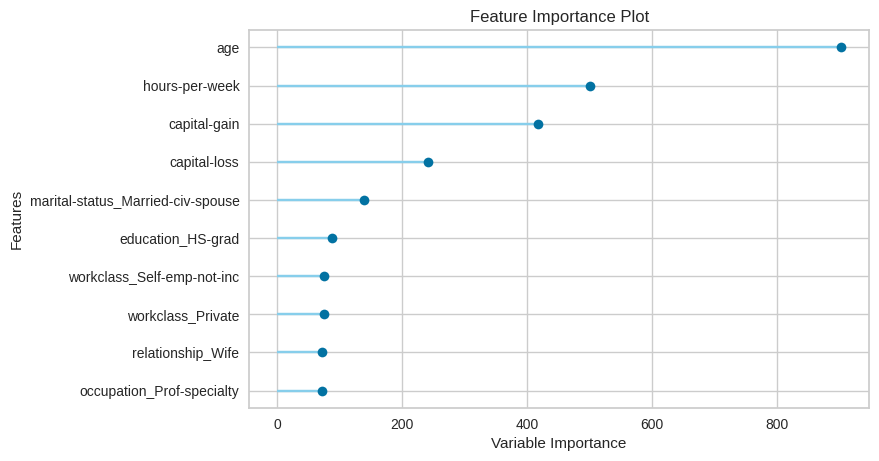

In [ ]:
# Feature importance Plot
plot_model(tuned_lgbm2, plot='feature')

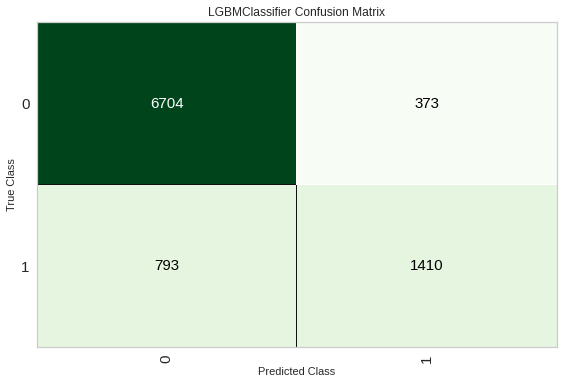

In [ ]:
# Matriz de confusão
plot_model(tuned_lgbm2, plot='confusion_matrix')

In [ ]:
# Grafico disponiveis
evaluate_model(tuned_lgbm2)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
# Predict uilizando a amostra de teste
predict_model(tuned_lgbm2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8744,0.929,0.64,0.7908,0.7075,0.6286,0.6343


,age,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,...,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,native-country_not_available,income >50K,Label,Score
0,23.0,0.0,0.0,15.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9993
1,68.0,2346.0,0.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9936
2,45.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0.6299
3,28.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9927
4,67.0,2009.0,0.0,40.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9275,36.0,0.0,0.0,54.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9635
9276,41.0,0.0,0.0,40.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.8826
9277,47.0,0.0,0.0,55.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.8602
9278,47.0,0.0,0.0,60.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,1,0.7192


In [ ]:
# Predict utilizando os dados de validação
validation_predictions = predict_model(tuned_lgbm2, data=data_validation)
validation_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8593,0.916,0.615,0.7664,0.6824,0.5934,0.5994


,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K,Label,Score
0,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0,0,0.7633
1,52,Self-emp-not-inc,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,1,0,0.6254
2,23,Local-gov,Assoc-acdm,12,Never-married,Protective-serv,Not-in-family,White,Male,0,0,52,United-States,0,0,0.9786
3,30,Federal-gov,Some-college,10,Married-civ-spouse,Adm-clerical,Own-child,White,Male,0,0,40,United-States,0,0,0.7989
4,48,Self-emp-not-inc,Assoc-acdm,12,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,0,1,0.5790


In [ ]:
# Veriicando a performance do modelo aplicando aos dados de validação
from pycaret.utils import check_metric
check_metric(validation_predictions['income >50K'], validation_predictions['Label'], metric='Accuracy')

0.8593

In [ ]:
# Finalizando o modelo
final_lgbm = finalize_model(tuned_lgbm2)

In [ ]:
# Verificando o modelo final 
print(final_lgbm)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=5,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=200, n_jobs=-1, num_leaves=50, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
# Salvando o modelo
save_model(final_lgbm,'Final LGBM Model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='income >50K', time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_s...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_rate=0.1, max_depth=5,
                                 min_child_samples=20,

# Módulo 3

In [ ]:
# Carregando os dados
dataset = get_data('income')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


In [ ]:
# Listando registros mising por atributos
dataset.isnull().sum()

age                  0
workclass         1836
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     583
income >50K          0
dtype: int64

In [ ]:
# Configurando o ambiente com a função Setup
exp_clf01 = setup( data = dataset,
                   target = 'income >50K',
                   session_id = 123,
                  categorical_imputation = 'mode')

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,4
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Verificando a função Setup
exp_clf01

({'ada': <pycaret.containers.models.classification.AdaBoostClassifierContainer at 0x7f9936e91250>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x7f9936e848d0>,
  'dummy': <pycaret.containers.models.classification.DummyClassifierContainer at 0x7f994a1fa850>,
  'et': <pycaret.containers.models.classification.ExtraTreesClassifierContainer at 0x7f9936e91310>,
  'gbc': <pycaret.containers.models.classification.GradientBoostingClassifierContainer at 0x7f9936e91890>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x7f9936e81250>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x7f9936e84b50>,
  'lda': <pycaret.containers.models.classification.LinearDiscriminantAnalysisContainer at 0x7f9936e84fd0>,
  'lightgbm': <pycaret.containers.models.classification.LGBMClassifierContainer at 0x7f9936e84d10>,
  'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierCo

In [ ]:
# Armazenando o Dataframe transformado
df_transformed = get_config('X_train')

In [ ]:
# Visualizando o df_transformed
df_transformed.head()

,age,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
19599,55.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
12982,49.0,0.0,0.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
15929,32.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
29192,52.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
13704,48.0,0.0,0.0,50.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
# Realizando a contagem de registro nulos por atributo
df_transformed.isnull().sum()

age                               0
capital-gain                      0
capital-loss                      0
hours-per-week                    0
workclass_Federal-gov             0
                                 ..
native-country_Thailand           0
native-country_Trinadad&Tobago    0
native-country_United-States      0
native-country_Vietnam            0
native-country_Yugoslavia         0
Length: 101, dtype: int64

In [ ]:
# Verificando as features transformadas
for column in df_transformed.columns:
  if column.startswith('occupation'):
    print(column)

occupation_Adm-clerical
occupation_Armed-Forces
occupation_Craft-repair
occupation_Exec-managerial
occupation_Farming-fishing
occupation_Handlers-cleaners
occupation_Machine-op-inspct
occupation_Other-service
occupation_Priv-house-serv
occupation_Prof-specialty
occupation_Protective-serv
occupation_Sales
occupation_Tech-support
occupation_Transport-moving


In [ ]:
for columns in df_transformed.columns:
  if column.startswith('native-country'):
    print(column)

native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-country_Yugoslavia
native-count

In [ ]:
# Verificando os valores mais frequentes
dataset['occupation'].value_counts()

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: occupation, dtype: int64

In [ ]:
dataset['native-country'].value_counts()

United-States                 29170
Mexico                          643
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
France                           29
Greece                      

In [ ]:
# Definindo um experimento para tratar missing values com input do tipo simple para features numéricas
dataset = get_data('income')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


In [ ]:
# Listando os registro nulos 
dataset.isnull().sum()

age                  0
workclass         1836
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     583
income >50K          0
dtype: int64

In [ ]:
# Alterando os dados de features com registros mising
dataset['education-num'] = dataset['education-num'].mask(np.random.random(dataset['education-num'].shape)<0.2)
dataset['capital-gain'] = dataset['capital-gain'].mask(np.random.random(dataset['capital-gain'].shape)<0.2)

In [ ]:
# Listando os missing values
dataset.isnull().sum()

age                  0
workclass         1836
education            0
education-num     6507
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain      6519
capital-loss         0
hours-per-week       0
native-country     583
income >50K          0
dtype: int64

In [ ]:
# Configurando o ambiente com a função Setup
exp_clf01 = setup(data = dataset,
                  target = 'income >50K',
                  session_id = 123,
                  numeric_features = ['education-num'])

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,5
7,Categorical Features,8
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Verificando o objeto criado
exp_clf01

({'ada': <pycaret.containers.models.classification.AdaBoostClassifierContainer at 0x7f9937810ed0>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x7f9937d451d0>,
  'dummy': <pycaret.containers.models.classification.DummyClassifierContainer at 0x7f9937829250>,
  'et': <pycaret.containers.models.classification.ExtraTreesClassifierContainer at 0x7f9938597a90>,
  'gbc': <pycaret.containers.models.classification.GradientBoostingClassifierContainer at 0x7f9937810fd0>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x7f9937d2e590>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x7f9937d45a50>,
  'lda': <pycaret.containers.models.classification.LinearDiscriminantAnalysisContainer at 0x7f9937c9eb50>,
  'lightgbm': <pycaret.containers.models.classification.LGBMClassifierContainer at 0x7f994a1c9dd0>,
  'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierCo

In [ ]:
# Armazenando o Dataframe transformado
df_transformed = get_config('X_train')

In [ ]:
# Contando os missing values
df_transformed.isnull().sum()

age                               0
education-num                     0
capital-gain                      0
capital-loss                      0
hours-per-week                    0
                                 ..
native-country_Trinadad&Tobago    0
native-country_United-States      0
native-country_Vietnam            0
native-country_Yugoslavia         0
native-country_not_available      0
Length: 104, dtype: int64

In [ ]:
# Verificando as estatisticas descritivas
dataset['education-num'].describe()

count    26054.000000
mean        10.082674
std          2.570959
min          1.000000
25%          9.000000
50%         10.000000
75%         12.000000
max         16.000000
Name: education-num, dtype: float64

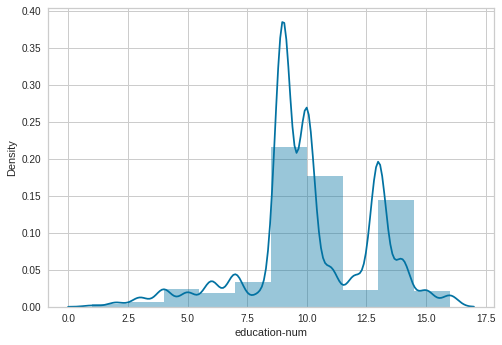

In [ ]:
# Vericifando a distribuição da feature
import seaborn as sns
sns.distplot(dataset['education-num'], bins=10)

In [ ]:
# Estatisticas descritivas do df_transformed
df_transformed['education-num'].describe()

count    22792.000000
mean        10.087264
std          2.317706
min          1.000000
25%          9.000000
50%         10.000000
75%         11.000000
max         16.000000
Name: education-num, dtype: float64

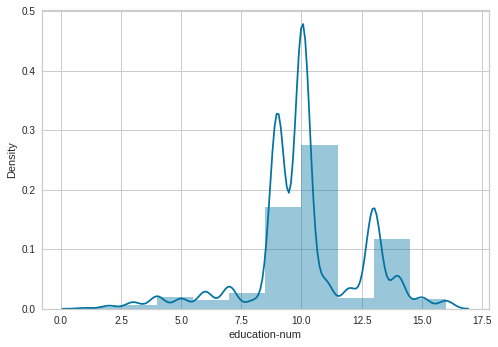

In [ ]:
# Distribuição df_transformed
sns.distplot(df_transformed['education-num'], bins=10)

In [ ]:
# Configurando o ambiente com a função Setup
exp_clf01 = setup( data = dataset,
                   target = 'income >50K',
                   session_id = 123,
                  numeric_features = ['education-num'],
                  numeric_imputation = 'zero')

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,5
7,Categorical Features,8
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Armazenando o dataframe transformado
df_transformed = get_config('X_train')

In [ ]:
# Verificando valores nulos
df_transformed.isnull().sum()

age                               0
education-num                     0
capital-gain                      0
capital-loss                      0
hours-per-week                    0
                                 ..
native-country_Trinadad&Tobago    0
native-country_United-States      0
native-country_Vietnam            0
native-country_Yugoslavia         0
native-country_not_available      0
Length: 104, dtype: int64

In [ ]:
# Estatistica descritiva
dataset['education-num'].describe()

count    26054.000000
mean        10.082674
std          2.570959
min          1.000000
25%          9.000000
50%         10.000000
75%         12.000000
max         16.000000
Name: education-num, dtype: float64

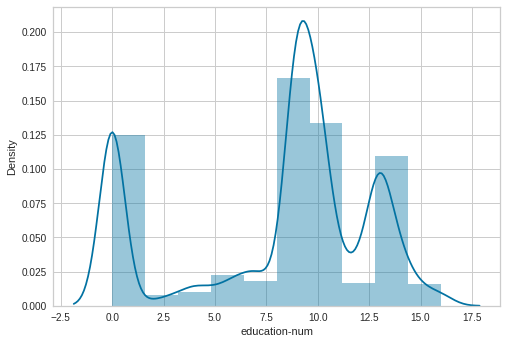

In [ ]:
# Distribuição da feature
sns.distplot(df_transformed['education-num'], bins=10)

In [ ]:
# Entendendo e criando um experimento para o método de input do tipo iterative em features numéricas
# Configurando o ambiente com a função Setup
exp_clf01 = setup( data = dataset,
                   target = 'income >50K',
                   session_id = 123,
                  numeric_features = ['education-num'],
                  imputation_type = 'iterative',
                  iterative_imputation_iters = 5)

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,5
7,Categorical Features,8
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Armazenando o Dataframe transformado
df_transformed = get_config('X_train')

In [ ]:
# Verificando os valores nulos
df_transformed.isnull().sum()

age                               0
education-num                     0
capital-gain                      0
capital-loss                      0
hours-per-week                    0
                                 ..
native-country_Thailand           0
native-country_Trinadad&Tobago    0
native-country_United-States      0
native-country_Vietnam            0
native-country_Yugoslavia         0
Length: 102, dtype: int64

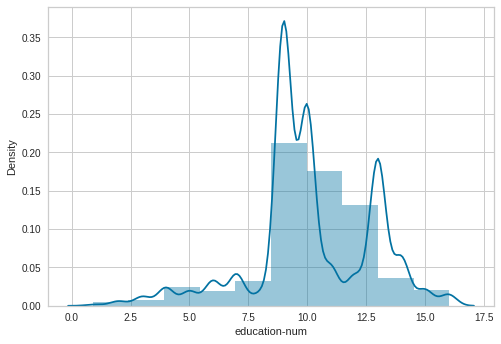

In [ ]:
# Plotando a distribuição da feature
sns.distplot(df_transformed['education-num'], bins=10)

In [ ]:
# Comparando métodos de input para registros missing
def compare_parameters(imputation_type,numeric_imputation,iterative_imputation_iters):
  results = {}
  print('Definindo o pipeline...')

  if imputation_type == 'simple':
    exp_clf01 = setup( data = dataset,
                       target = 'income >50K',
                       session_id = 123,
                       numeric_features = ['education-num'],
                       imputation_type = imputation_type,
                       numeric_imputation = numeric_imputation,
                       silent = True,
                       verbose = False,
                       html = False)
  else:
    exp_clf01 = setup( data = dataset,
                       target = 'income >50K',
                       session_id = 123,
                       numeric_features = ['education-num'],
                       imputation_type = imputation_type,
                       iterative_imputation_iters = iterative_imputation_iters,
                       silent = True,
                       verbose = False,
                       html= False)
    
  print('Criando o modelo')
  lgbm = create_model('lightgbm',
                      silent = True,
                      verbose = False,
                      html = False)
  
  grid = pull()

  print('Armazenando o resultado')

  results['imputation_type'] = imputation_type
  results['numeric_imputation'] = numeric_imputation
  results['iterative_imputation_iters'] = iterative_imputation_iters
  results['accuracy_mean'] = grid['Accuracy']['Mean']    

  return results
  

In [ ]:
scores = []
params = [['simple','mean',0],
          ['simple','median',0],
          ['simple','zero',0],
          ['iterative',0,5],
          ['iterative',0,10]]

for row in params:
  print('Processando parametros {},{},{}'.format(row[0],row[1],row[2]))

  scores.append(compare_parameters(row[0],row[1],row[2]))

Processando parametros simple,mean,0
Definindo o pipeline...
Criando o modelo
Armazenando o resultado
Processando parametros simple,median,0
Definindo o pipeline...
Criando o modelo
Armazenando o resultado
Processando parametros simple,zero,0
Definindo o pipeline...
Criando o modelo
Armazenando o resultado
Processando parametros iterative,0,5
Definindo o pipeline...
Criando o modelo
Armazenando o resultado
Processando parametros iterative,0,10
Definindo o pipeline...
Criando o modelo
Armazenando o resultado


In [ ]:
# Verificando os resultados e seus scores
for score in scores:
  print(score)

{'imputation_type': 'simple', 'numeric_imputation': 'mean', 'iterative_imputation_iters': 0, 'accuracy_mean': 0.8659}
{'imputation_type': 'simple', 'numeric_imputation': 'median', 'iterative_imputation_iters': 0, 'accuracy_mean': 0.8664}
{'imputation_type': 'simple', 'numeric_imputation': 'zero', 'iterative_imputation_iters': 0, 'accuracy_mean': 0.8674}
{'imputation_type': 'iterative', 'numeric_imputation': 0, 'iterative_imputation_iters': 5, 'accuracy_mean': 0.8644}
{'imputation_type': 'iterative', 'numeric_imputation': 0, 'iterative_imputation_iters': 10, 'accuracy_mean': 0.865}


In [ ]:
# Codificando features categóricas preservando a ordem de grandeza
dataset = get_data('income')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


In [ ]:
# Configurando o ambiente com a função Setup
exp_clf01 = setup(data = dataset,
                  target = 'income >50K',
                  session_id = 123,
                  ordinal_features = {'education':
                                       [ 
                                               'Preschool'
                                              ,'1st-4th'
                                              ,'5th-6th'
                                              ,'7th-8th'
                                              ,'9th'
                                              ,'10th'
                                              ,'11th'
                                              ,'12th'
                                              ,'HS-grad'
                                              ,'Prof-school'
                                              ,'Assoc-acdm'
                                              ,'Assoc-voc'
                                              ,'Some-college'
                                              ,'Bachelors'
                                              ,'Masters'
                                              ,'Doctorate'
                                         ]
                                      },
                  high_cardinality_features = ['native-country'],
                  high_cardinality_method = 'clustering')

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,4
7,Categorical Features,9
8,Ordinal Features,True
9,High Cardinality Features,True


In [ ]:
# Recuperando dataframe transformado
df_transformed = get_config('X_train')
df_transformed.head()

,age,education,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,...,relationship_Wife,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Female,native-country_0,native-country_1,native-country_2
19599,55.0,8.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
12982,49.0,13.0,0.0,0.0,40.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
15929,32.0,13.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
29192,52.0,12.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
13704,48.0,6.0,0.0,0.0,50.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [ ]:
# Criando um experimento para tratar features com alta cardinalidade
# Configurando o ambiente
exp_clf01 = setup(  data = dataset
                  , target = 'income >50K'
                  , session_id=123
                  , ordinal_features = {'education' : 
                                         [ 
                                               'Preschool'
                                              ,'1st-4th'
                                              ,'5th-6th'
                                              ,'7th-8th'
                                              ,'9th'
                                              ,'10th'
                                              ,'11th'
                                              ,'12th'
                                              ,'HS-grad'
                                              ,'Prof-school'
                                              ,'Assoc-acdm'
                                              ,'Assoc-voc'
                                              ,'Some-college'
                                              ,'Bachelors'
                                              ,'Masters'
                                              ,'Doctorate'
                                         ]
                                      }
                  , high_cardinality_features = ["native-country"]
                  , high_cardinality_method = "clustering"
                 )

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(32561, 14)"
5,Missing Values,True
6,Numeric Features,4
7,Categorical Features,9
8,Ordinal Features,True
9,High Cardinality Features,True


In [ ]:
# Recuperando o dataset transformado
df_transformed = get_config('X_train')
df_transformed.head()

,age,education,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,...,relationship_Wife,race_Amer-Indian-Eskimo,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Female,native-country_0,native-country_1,native-country_2
19599,55.0,8.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
12982,49.0,13.0,0.0,0.0,40.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
15929,32.0,13.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
29192,52.0,12.0,0.0,0.0,40.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
13704,48.0,6.0,0.0,0.0,50.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [ ]:
# Tratando features com baixa variância
# Carregando os dados
dataset = get_data('income')

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


In [ ]:
# Adicionando a nova feature com baixa variância
dataset['feature_test'] = 'comum_value'
dataset.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K,feature_test
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0,comum_value
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0,comum_value
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0,comum_value
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0,comum_value
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0,comum_value


In [ ]:
# Verificando o percentual de cada valor
dataset['feature_test'].value_counts(normalize=True) * 100

comum_value    100.0
Name: feature_test, dtype: float64

In [ ]:
# Inserindo um registro raro
dataset.at['feature_test'] = 'rare'
dataset.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income >50K,feature_test
0,39.0,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,0.0,comum_value
1,50.0,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,0.0,comum_value
2,38.0,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,0.0,comum_value
3,53.0,Private,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,0.0,comum_value
4,28.0,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,0.0,comum_value


In [ ]:
index_rare = dataset['feature_test'].sample(frac=0.10).index
dataset.at[index_rare, 'feature_tst'] = 'rare'

In [ ]:
# Configurando o ambiente
exp_clf01 = setup(  data = dataset
                  , target = 'income >50K'
                  , session_id = 123
                  , ignore_low_variance = True
                  , silent = True
                  , verbose = False
                 )

In [ ]:
# Armazenando o Dataframe transformado
df_transformed = get_config('X_train')
df_transformed.head()

,age_17.0,age_18.0,age_19.0,age_20.0,age_21.0,age_22.0,age_23.0,age_24.0,age_25.0,age_26.0,...,hours-per-week_9.0,hours-per-week_90.0,hours-per-week_91.0,hours-per-week_92.0,hours-per-week_94.0,hours-per-week_95.0,hours-per-week_96.0,hours-per-week_97.0,hours-per-week_98.0,hours-per-week_99.0
19599,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12982,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15929,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Colunas do dataframe
df_transformed.columns

Index(['age_17.0', 'age_18.0', 'age_19.0', 'age_20.0', 'age_21.0', 'age_22.0',
       'age_23.0', 'age_24.0', 'age_25.0', 'age_26.0',
       ...
       'hours-per-week_9.0', 'hours-per-week_90.0', 'hours-per-week_91.0',
       'hours-per-week_92.0', 'hours-per-week_94.0', 'hours-per-week_95.0',
       'hours-per-week_96.0', 'hours-per-week_97.0', 'hours-per-week_98.0',
       'hours-per-week_99.0'],
      dtype='object', length=223)

In [ ]:
# Trabalhando com registros categóricos raros
# Listando os valores até o quartil de 25%
lista = dataset['native-country'].value_counts(ascending=True).values
lista

array([    1,     1,    12,    13,    13,    14,    16,    18,    18,
          19,    19,    20,    24,    28,    29,    29,    31,    34,
          37,    43,    44,    51,    59,    60,    62,    64,    67,
          70,    73,    75,    80,    81,    90,    95,   100,   106,
         114,   121,   137,   198,   643, 29170])

In [ ]:
# Valor do percentil
np.percentile(lista,25)

19.25

In [ ]:
# Definindo o PipeLine
exp_clf01 = setup(  data = dataset
                  , target = 'income >50K'
                  , session_id = 123
                  , combine_rare_levels = True
                  , rare_level_threshold = 0.25
                  , silent = True
                 )

,Description,Value
0,session_id,123
1,Target,income >50K
2,Target Type,Multiclass
3,Label Encoded,"0.0: 0, 1.0: 1, rare: 2"
4,Original Data,"(32562, 16)"
5,Missing Values,True
6,Numeric Features,0
7,Categorical Features,15
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Armazenando o dataframe transformado
df_transformed = get_config('X_train')
df_transformed.head()

,age_17.0,age_18.0,age_19.0,age_20.0,age_21.0,age_22.0,age_23.0,age_24.0,age_25.0,age_26.0,...,native-country_Poland,native-country_Portugal,native-country_Puerto-Rico,native-country_South,native-country_Taiwan,native-country_United-States,native-country_Vietnam,native-country_not_available,native-country_others_infrequent,feature_test_rare
19599,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
12982,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
15929,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
29193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
# Verificando as features criadas
for c in df_transformed.columns:
  if 'native-country' in c:
    print(c)

native-country_Canada
native-country_China
native-country_Columbia
native-country_Cuba
native-country_Dominican-Republic
native-country_Ecuador
native-country_El-Salvador
native-country_England
native-country_France
native-country_Germany
native-country_Greece
native-country_Guatemala
native-country_Haiti
native-country_India
native-country_Iran
native-country_Ireland
native-country_Italy
native-country_Jamaica
native-country_Japan
native-country_Mexico
native-country_Nicaragua
native-country_Peru
native-country_Philippines
native-country_Poland
native-country_Portugal
native-country_Puerto-Rico
native-country_South
native-country_Taiwan
native-country_United-States
native-country_Vietnam
native-country_not_available
native-country_others_infrequent


In [ ]:
# Aplicando métodos de feature selection
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

In [ ]:
# Carregando os dados
dataset = get_data('wine')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [ ]:
# Separando os dados em treino e teste
X = dataset.drop(['type'], axis=1)
y = dataset['type']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12)

In [ ]:
# Instanciando o modelo
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# Verificando as features importantes
rf.feature_importances_

array([0.0332121 , 0.11115819, 0.0221584 , 0.05008745, 0.28250812,
       0.04628971, 0.30721335, 0.0580437 , 0.02190472, 0.05497193,
       0.00933699, 0.00311532])

Text(0.5, 0, 'Random Forest Feature Importance')

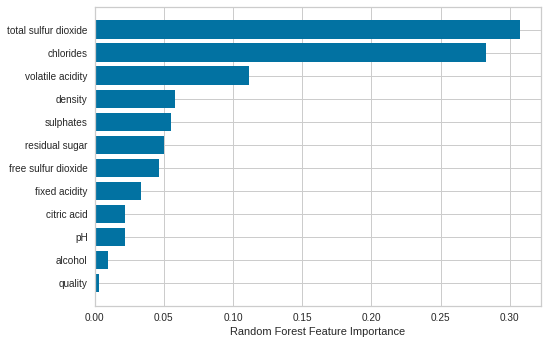

In [ ]:
# Plot das features
import matplotlib.pyplot as plt

sorted_idx = rf.feature_importances_.argsort()
plt.barh( X.columns[sorted_idx],
          rf.feature_importances_[sorted_idx],)
plt.xlabel('Random Forest Feature Importance')

In [ ]:
# Verificando os scores das features
for fn, fi in zip(X.columns[sorted_idx],rf.feature_importances_[sorted_idx]):
  print(fn, fi)

quality 0.0031153217671628336
alcohol 0.00933699309409203
pH 0.021904721698095778
citric acid 0.022158401125686216
fixed acidity 0.03321210391155931
free sulfur dioxide 0.046289709026563826
residual sugar 0.05008745295561284
sulphates 0.05497193470518954
density 0.05804370395099839
volatile acidity 0.11115819207236285
chlorides 0.2825081184305844
total sulfur dioxide 0.3072133472620922


In [ ]:
# Configurando o ambiente 
exp_clf01 = setup(  data = dataset
                  , target = 'type'
                  , session_id = 123
                  , numeric_features = ["quality"]
                  , feature_selection = True
                  , feature_selection_threshold = 0.4
                  , silent = True
                  , verbose = True
                 )

,Description,Value
0,session_id,123
1,Target,type
2,Target Type,Binary
3,Label Encoded,"red: 0, white: 1"
4,Original Data,"(6497, 13)"
5,Missing Values,False
6,Numeric Features,12
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Armazenando o dataframe transformado
df_transformed = get_config('X_train')
df_transformed

,total sulfur dioxide,density,chlorides,sulphates,residual sugar,volatile acidity,fixed acidity
2457,149.0,0.99725,0.038,0.54,10.200000,0.22,6.7
524,116.0,0.99760,0.086,0.64,2.400000,0.43,9.2
4551,109.0,0.99290,0.041,0.54,1.800000,0.27,6.1
5954,137.0,0.98946,0.039,0.38,2.500000,0.31,6.4
3759,124.0,0.99540,0.040,0.48,9.700000,0.33,6.0
...,...,...,...,...,...,...,...
5218,122.0,1.00295,0.031,0.42,26.049999,0.45,6.8
4060,71.0,0.99402,0.053,0.49,2.600000,0.26,8.2
1346,13.0,0.99472,0.056,0.56,2.100000,0.59,6.1
3454,197.0,0.99810,0.053,0.45,14.000000,0.22,8.0


In [ ]:
# Quantitativo de features do dataset transformado
len(df_transformed.columns)

7

In [ ]:
# Quantitativo de features do dataset original
len(dataset.drop(['type'], axis=1).columns)

12